In [2]:
from verl.workers.rollout.env_workers.maniskill_env_worker import EnvActor
import numpy as np
from PIL import Image
from IPython.display import display

env_actor = EnvActor()
env_ids = ['StackCube-v1'] * 4
env_uniq = [1] * 4
task_instructions = [''] * len(env_uniq)

 

init_state = env_actor.init_venv(
    env_ids=env_ids,
    env_unique_ids=env_uniq,
    task_instructions=task_instructions,
    n_samples=2,
)

/mnt/nfs3/caozhe/miniconda3/envs/verl/lib/python3.10/site-packages/torch/random.py:187: UserWarning: CUDA reports that you have 8 available devices, and you have used fork_rng without explicitly specifying which devices are being used. For safety, we initialize *every* CUDA device by default, which can be quite slow if you have a lot of CUDAs. If you know that you are only making use of a few CUDA devices, set the environment variable CUDA_VISIBLE_DEVICES or the 'devices' keyword argument of fork_rng with the set of devices you are actually using. For example, if you are using CPU only, set device.upper()_VISIBLE_DEVICES= or devices=[]; if you are using device 0 only, set CUDA_VISIBLE_DEVICES=0 or devices=[0].  To initialize all devices and suppress this warning, set the 'devices' keyword argument to `range(torch.cuda.device_count())`.
  warnings.warn(message)
/mnt/nfs3/caozhe/miniconda3/envs/verl/lib/python3.10/site-packages/gymnasium/core.py:311: UserWarning: WARN: env.get_state_dict

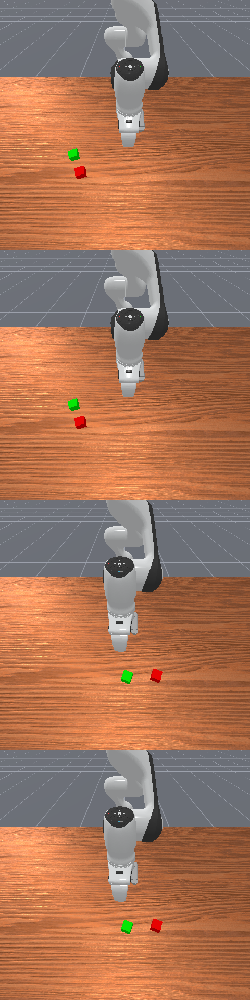

In [4]:
obs = init_state['obs']
cam = obs['sensor_data']['base_camera']['rgb'].reshape(-1, *obs['sensor_data']['base_camera']['rgb'].shape[-2:])
img = Image.fromarray(cam.astype(np.uint8))
display(img)

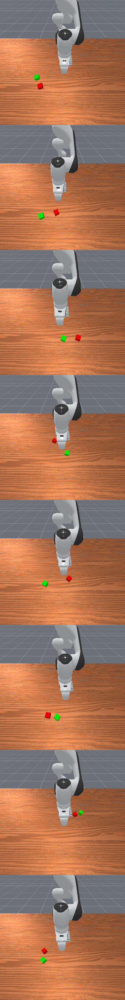

In [59]:
import mani_skill.envs
import gymnasium as gym
from mani_skill.vector.wrappers.gymnasium import ManiSkillVectorEnv
import numpy as np
import traceback
from internvla.models.utils import action_to_str, write_instruction_action
from copy import deepcopy



env = gym.make(
    env_ids[0], 
    num_envs=4,
    obs_mode="rgb",
    control_mode="pd_ee_delta_pose",
    sensor_configs={'height': 480, 'width': 480},
    max_episode_steps=150,
    reward_mode='sparse',
)



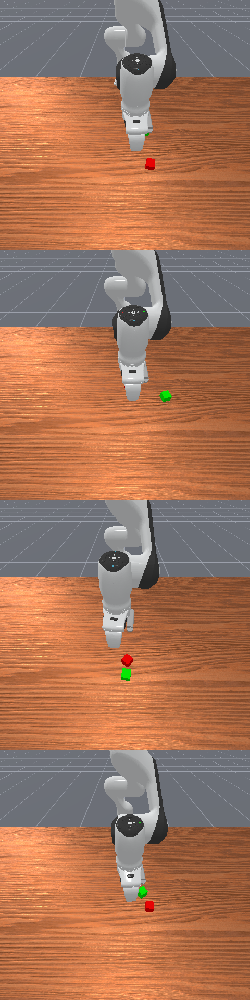

In [ ]:
# seeds = np.zeros(4, dtype=np.int32)
# seeds[-2:] = 2
# obs, _ = env.reset(seed=seeds)
# cam = obs['sensor_data']['base_camera']['rgb'].reshape(-1, *obs['sensor_data']['base_camera']['rgb'].shape[-2:])
# img = Image.fromarray(cam.cpu().numpy().astype(np.uint8))
# display(img)

In [60]:
state_dict = env.base_env.get_state_dict()
new_state_dict = copy_state_dict(state_dict, num_samples=2)

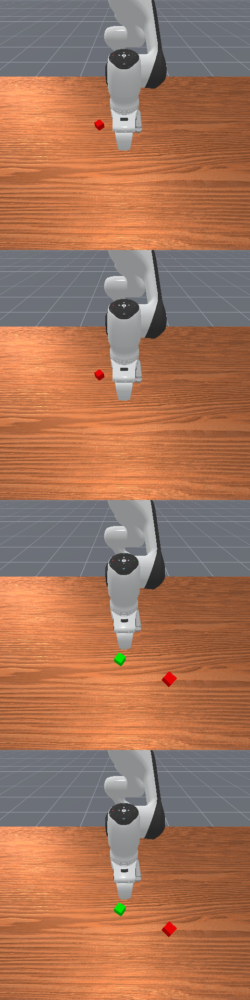

In [61]:

obs, _ = env.reset(options={'reset_to_env_states': {'env_states': new_state_dict}})
cam = obs['sensor_data']['base_camera']['rgb'].reshape(-1, *obs['sensor_data']['base_camera']['rgb'].shape[-2:])
img = Image.fromarray(cam.cpu().numpy().astype(np.uint8))
display(img)

In [34]:
new_state_dict

{'actors': {'table-workspace': tensor([[-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  

In [15]:
old_state_dict = deepcopy(state_dict)

In [23]:
new_state_dict = copy_state_dict(old_state_dict, num_samples=8)

In [20]:
old_state_dict

{'actors': {'table-workspace': tensor([[-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  

In [24]:
new_state_dict

{'actors': {'table-workspace': tensor([[-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [-0.1200,  0.0000, -0.9196,  0.7071,  0.0000,  0.0000,  0.7071,  0.0000,
            0.0000,  0.0000,  0.0000,  0.0000,  

In [ ]:
state_dict['actors']['table-workspace']

torch.Size([16, 13])

In [ ]:

seeds

array([0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2], dtype=int32)

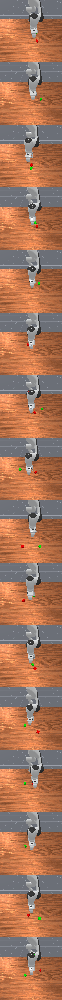

In [ ]:
env.base_env

In [ ]:
env = ManiSkillVectorEnv(
    env="StackCube-v1",
    num_envs=10,
    auto_reset=True,
    ignore_terminations=False,
)

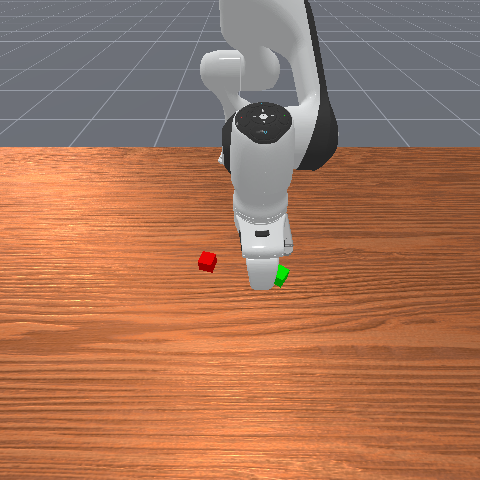

In [29]:
obs, _ = env.reset(seed=0)
obs['sensor_data']['base_camera']['rgb'].shape

from PIL import Image
img = Image.fromarray(obs['sensor_data']['base_camera']['rgb'][0].cpu().numpy().astype(np.uint8))
from PIL import Image
from IPython.display import display
display(img)